In [21]:
import irve
import importlib
importlib.reload(irve)
from irve import *

In [22]:
#thresh = 50
thresh = 200

small_amenageurs = irve.df.groupby("nom_amenageur")["id_pdc_itinerance"].count()
small_amenageurs = small_amenageurs[small_amenageurs<thresh].index

small_operators = irve.df.groupby("nom_operateur")["id_pdc_itinerance"].count()
small_operators = small_operators[small_operators<thresh].index

small_enseignes = irve.df.groupby("nom_enseigne")["id_pdc_itinerance"].count()
small_enseignes = small_enseignes[small_enseignes<thresh].index

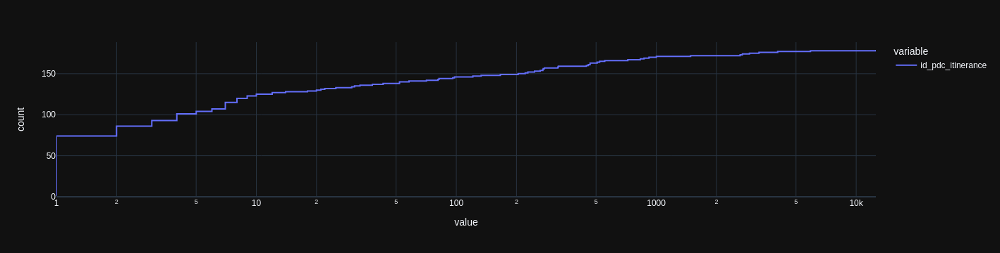

In [31]:
irve_filtered2 = irve.df[
  (~irve.df["nom_operateur"].isin(small_operators))  
][["nom_amenageur","nom_operateur","nom_enseigne"]]

px.ecdf(irve.df.groupby("nom_operateur")["id_pdc_itinerance"].count()
        ,ecdfnorm=None
        ,log_x=True)

In [37]:
f"Scope de dataset opéré par les grands comptes: {irve_filtered2.shape[0]/irve.df.shape[0]:.3f}"

'Scope de dataset opéré par les grands comptes: 0.971'

In [38]:
irve_filtered = irve.df[
  (~irve.df["nom_amenageur"].isin(small_amenageurs)) & \
  (~irve.df["nom_operateur"].isin(small_operators)) & \
  (~irve.df["nom_enseigne"].isin(small_enseignes))    
][["nom_amenageur","nom_operateur","nom_enseigne"]]
irve_filtered["cl"]=0

f"Scope visualisé: {irve_filtered.shape[0]/irve.df.shape[0]}"


'Scope visualisé: 0.5307760610903924'

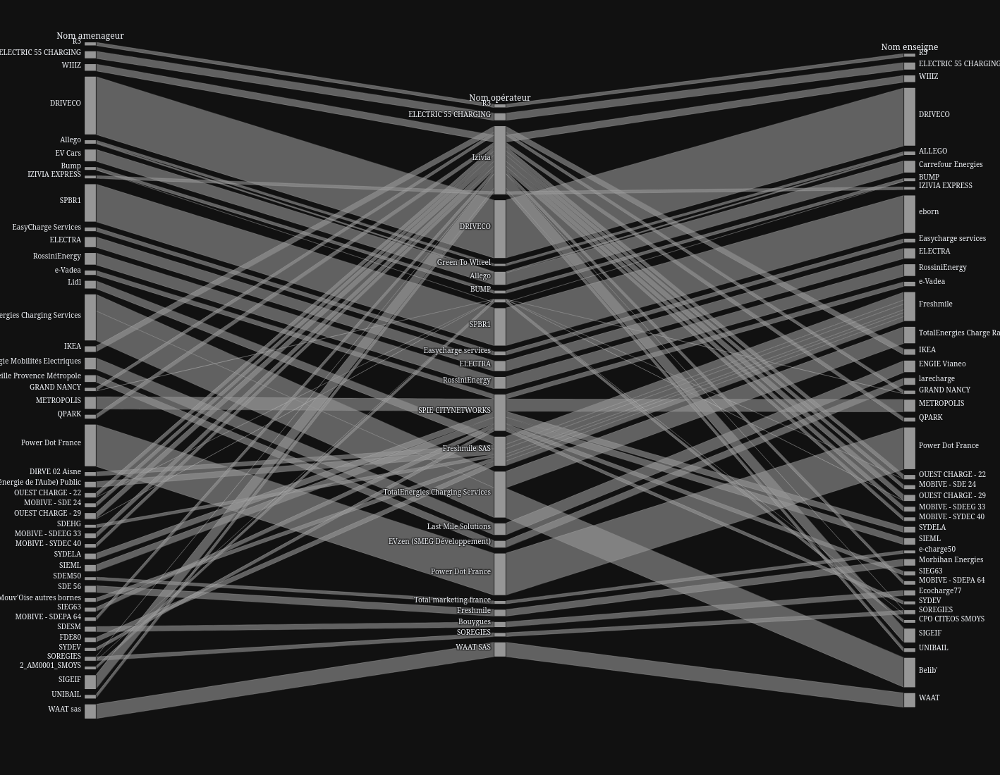

In [39]:
fig = px.parallel_categories(irve_filtered
                            ,height= 1100
                            ,width=800
                            ,dimensions=["nom_amenageur","nom_operateur", "nom_enseigne"]
                            ,color ="cl"
                            ,color_continuous_scale=px.colors.sequential.Greys
                            ,labels=irve.labels
                            )
fig.update_coloraxes(showscale=False)
fig.update_layout(
    font_family="Raleway"
)
fig.write_image("img/4_par1.svg")
fig
#fig = px.parallel_categories(irve_filtered
#                             , height= 5100
#                             , width=1200
#                             , dimensions=["nom_amenageur","nom_operateur", "nom_enseigne"]
#                            )


## Tendances et whales

In [16]:
thresh = 20

top_amen = irve.df.groupby("nom_amenageur")["id_pdc_itinerance"].count().sort_values().tail(thresh).index

top_operat = irve.df.groupby("nom_operateur")["id_pdc_itinerance"].count().sort_values().tail(thresh).index

top_enseignes = irve.df.groupby("nom_enseigne")["id_pdc_itinerance"].count().sort_values().tail(thresh).index

### Aménageurs

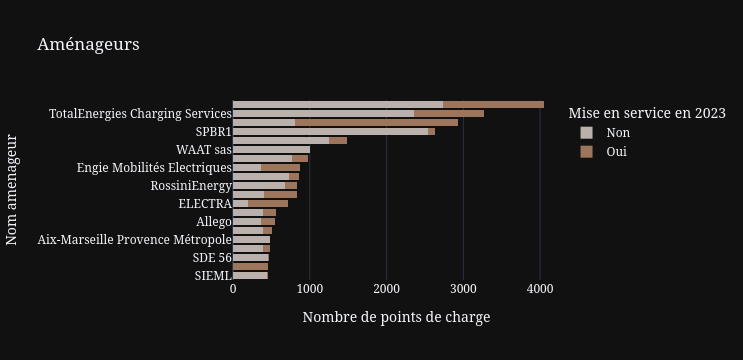

In [17]:
fig = px.histogram(irve.df[irve.df["nom_amenageur"].isin(top_amen)]
            ,y="nom_amenageur"
            ,color="mis_en_service_cette_annee"
            ,barmode="stack"
            ,labels = irve.labels
            ,title="Aménageurs"
            ,color_discrete_sequence=px.colors.qualitative.T10[::-1])\
  .update_yaxes(categoryorder="total ascending")

fig.update_layout(
    font_family="Raleway",
    xaxis_title = "Nombre de points de charge"
)

fig.write_image("img/4_amenageurs.svg")
fig

## Opérateurs

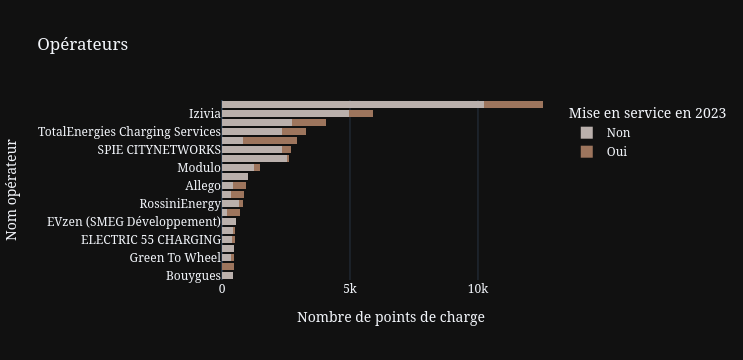

In [18]:
fig = px.histogram(irve.df[irve.df["nom_operateur"].isin(top_operat)]
            ,y="nom_operateur"
            ,color="mis_en_service_cette_annee"
            ,barmode="stack"
            ,labels = irve.labels
            ,title="Opérateurs"
            ,color_discrete_sequence=px.colors.qualitative.T10[::-1])\
  .update_yaxes(categoryorder="total ascending")

fig.update_layout(
    font_family="Raleway",
    xaxis_title = "Nombre de points de charge"
)

fig.write_image("img/4_operateurs.svg")
fig

## Enseigne

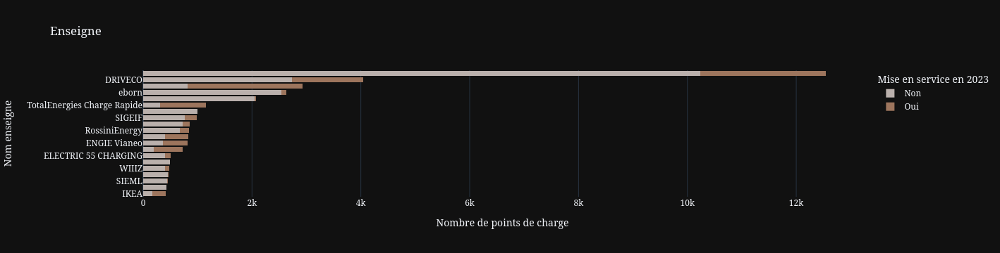

In [19]:
fig = px.histogram(irve.df[irve.df["nom_enseigne"].isin(top_enseignes)]
            ,y="nom_enseigne"
            ,color="mis_en_service_cette_annee"
            ,barmode="stack"
            ,title="Enseigne"
            ,labels = irve.labels
            ,color_discrete_sequence=px.colors.qualitative.T10[::-1])\
  .update_yaxes(categoryorder="total ascending")

fig.update_layout(
    font_family="Raleway",
    xaxis_title = "Nombre de points de charge"
)

fig.write_image("img/4_enseigne.svg")
fig
